In [17]:
#conda create -n exp python=3.11 ipykernel
#pip install sdv
#pip install statsmodels synloc
import synloc as s
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.datasets import fetch_california_housing
import statsmodels.api as sm
from statsmodels.iolib.summary2 import summary_col
from sdv.metrics.tabular import KSComplement
from sdv.lite import SingleTablePreset # sdv = 1.9.0
#from sdv.tabular import GaussianCopula, CTGAN
import subprocess

The Local resampler is expected to perform well on convex distributions. Therefore, non-convex distributions which are clustered around different spaces are selected for the simulation purpose. We first simulate the following distribution:
$$
\begin{aligned}
    u_{j,i} &\sim Normal(0, 1),  \\
    x_i &\sim r_i * \cos{a_i} + u_{1,i},\\
    y_i &\sim 0.5 x_i - 0.05 x_i^2 + r_i * \sin{a_i} + u_{2,i},
\end{aligned}
$$

where $r_i$ is 8 or 20 with same probability, and $a_i$ is drawn from a uniform distribution with lower and upper bounds, 0 and $ 2\pi$, respectively. 

We locally estimate multivariate normal distribution with $k=20$ and draw synthetic values from the estimated distributions. 

In [18]:
data = s.sample_circulars_xy(1000)
data.to_csv('circulars.csv', index=False) # for replication purposes
data2 = s.sample_trivariate_xyz(1000)
data2.to_csv('trivariate.csv', index=False) # for replication purposes

In [21]:
syn_loc_cov = s.LocalCov(data, K = 15)
syn_loc_cov.fit()

100%|██████████| 1000/1000 [00:00<00:00, 1342.96it/s]


,x,y
0,-19.295928,-22.096489
1,-8.336562,-26.859751
2,6.975366,0.027318
3,1.738849,-19.449653
4,16.061927,-18.046909
...,...,...
995,-3.334736,-21.759905
996,5.078647,8.063192
997,9.118360,-16.018085
998,-2.533384,16.706642


In [22]:

syn_loc_cop = s.LocalGaussianCopula(data, K = 15)
syn_loc_cop.fit()

100%|██████████| 1000/1000 [00:05<00:00, 187.47it/s]


,x,y
0,-18.906511,-21.747302
1,-9.782249,-27.351159
2,7.460659,2.220468
3,-2.050207,-21.081322
4,16.154995,-17.550193
...,...,...
995,-2.707532,-20.411439
996,6.190005,8.335630
997,11.794286,-17.624297
998,-3.104265,18.084558


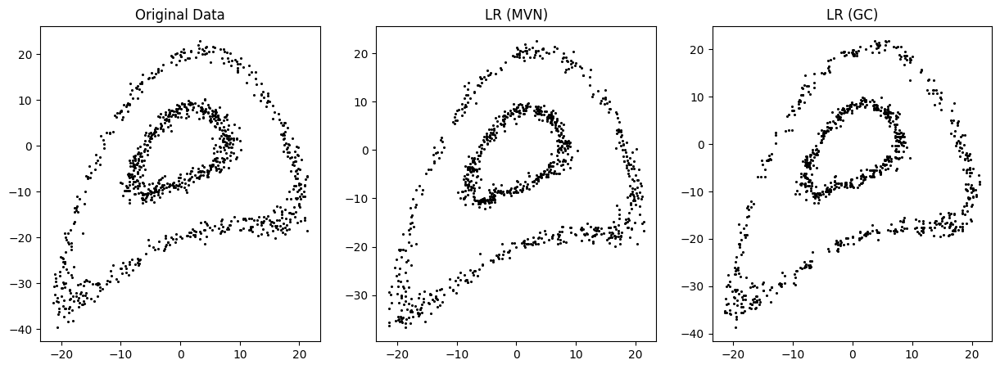

In [91]:
# plot `data`, `syn_loc_cov` and `syn_loc_cop`
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].scatter(data['x'], data['y'], s=1.5, color='black')
ax[0].set_title('Original Data')
ax[1].scatter(syn_loc_cov.synthetic['x'], syn_loc_cov.synthetic['y'], s=1.5, color='black')
ax[1].set_title('LR (MVN)')
ax[2].scatter(syn_loc_cop.synthetic['x'], syn_loc_cop.synthetic['y'], s=1.5, color='black')
ax[2].set_title('LR (GC)')
plt.savefig('../../img/circulars_knn_black.eps', format='eps', bbox_inches='tight')
plt.show()

In [23]:
syn_clu_cov = s.clusterCov(data, n_clusters=30, size_min=10)
syn_clu_cov.fit()

,x,y
0,-13.665679,-30.061780
1,-12.403012,-29.520126
2,-12.742746,-30.045700
3,-14.231835,-30.845464
4,-11.379847,-29.900097
...,...,...
24,-17.549290,-34.198605
25,-13.712747,-31.452996
26,-17.324129,-34.879799
27,-19.122061,-30.540683


In [24]:
syn_clu_cop = s.clusterGaussCopula(data, n_clusters=30, size_min=10)
syn_clu_cop.fit()

,x,y
0,17.837643,-17.278835
1,17.224173,-17.366696
2,17.596167,-16.258267
3,20.948346,-16.696914
4,17.623163,-15.924458
...,...,...
41,5.037617,-6.462685
42,4.676910,-3.414318
43,6.001592,-5.937320
44,6.420199,-2.894663


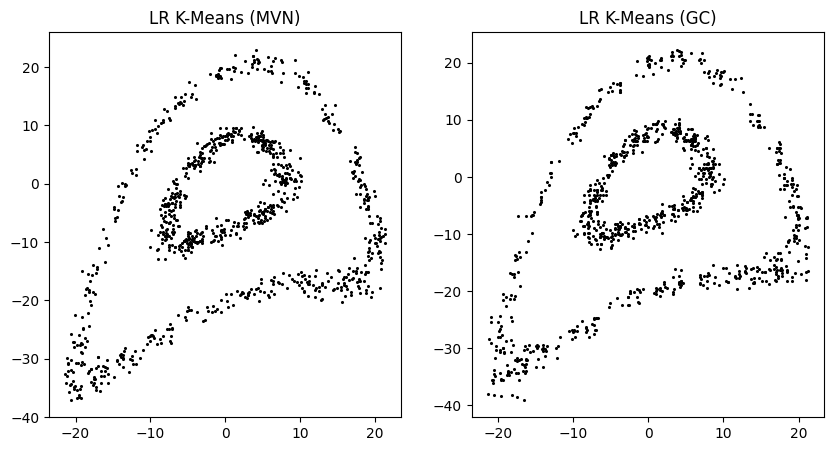

In [92]:
# now plot `syn_clu_cov` and `syn_clu_cop`
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].scatter(syn_clu_cov.synthetic['x'], syn_clu_cov.synthetic['y'], s=1.5, color='black')
ax[0].set_title('LR K-Means (MVN)')
ax[1].scatter(syn_clu_cop.synthetic['x'], syn_clu_cop.synthetic['y'], s=1.5, color='black')
ax[1].set_title('LR K-Means (GC)')
plt.savefig('../../img/circulars_kmeans_black.eps', format='eps', bbox_inches='tight')
plt.show()

Figure reff shows that noncovex distributions can be replicated quite well with locally estimated distributions, even though synthetic values are drawn from the multivariate normal distribution. Note that, we use $k=20$ to estimate each distribution whereas this is a bivariate sample. It is possible to replicate original sample more accurately with smaller $k$.

The next simulation generates a trivariate sample as follows:

$$
\begin{aligned}
x_i &\sim Beta(0.1,\,0.1),\\
y_i &\sim Beta(0.1,\, 0.5),\\
z_i &\sim 10 * y_i + u_i,
\end{aligned}
$$

where $u_i$ is drawn from a standard normal distribution. Again, we locally estimate multivariate normal distribution with $k=20$ and draw synthetic values from the estimated distributions. 

In [26]:
syn_loc_cov2 = s.LocalCov(data2, K = 15)
syn_loc_cov2.fit()
syn_loc_cop2 = s.LocalGaussianCopula(data2, K = 15)
syn_loc_cop2.fit()
syn_clu_cov2 = s.clusterCov(data2, n_clusters=30, size_min=10)
syn_clu_cov2.fit()
syn_clu_cop2 = s.clusterGaussCopula(data2, n_clusters=30, size_min=10)
syn_clu_cop2.fit()

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 1000/1000 [00:05<00:00, 193.66it/s]


,x,y,z
0,1.000000,1.979864e-06,-1.831662
1,0.899318,9.266599e-06,-1.214948
2,0.999568,2.369213e-04,-1.177803
3,0.998066,6.754925e-08,-1.407815
4,0.999674,5.513820e-09,-1.655439
...,...,...,...
10,1.000000,6.082175e-01,5.528339
11,0.999984,6.086238e-01,6.346188
12,0.999305,6.475744e-01,6.350599
13,1.000000,7.146454e-01,6.372814


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


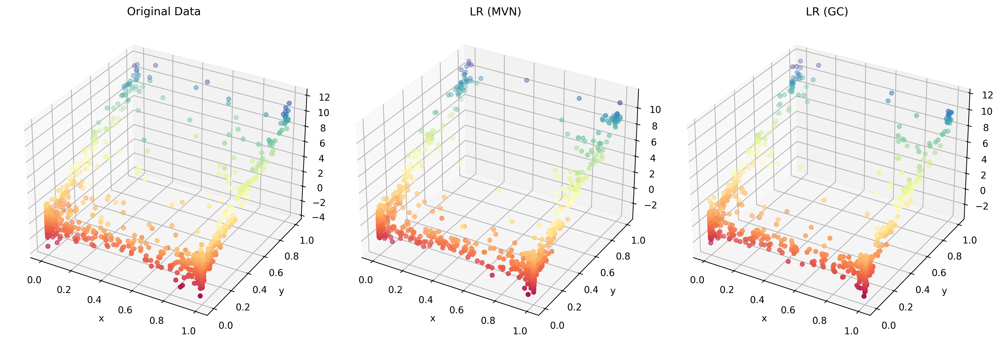

In [95]:
# plot `data2`, `syn_loc_cov2` and `syn_loc_cop2`
fig = plt.figure(figsize=(15, 5), dpi=300)
ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')
ax1.scatter(data2.x, data2.y, data2.z, c = data2.z, cmap='Spectral')
ax2.scatter(syn_loc_cov2.synthetic.x, syn_loc_cov2.synthetic.y, syn_loc_cov2.synthetic.z, c = syn_loc_cov2.synthetic.z, cmap='Spectral')
ax3.scatter(syn_loc_cop2.synthetic.x, syn_loc_cop2.synthetic.y, syn_loc_cop2.synthetic.z, c = syn_loc_cop2.synthetic.z, cmap='Spectral')
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('z')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')
ax3.set_xlabel('x')
ax3.set_ylabel('y')
ax3.set_zlabel('z')
ax1.set_title('Original Data')
ax2.set_title('LR (MVN)')
ax3.set_title('LR (GC)')
plt.tight_layout()
plt.savefig('../../img/trivariate_knn.eps', format='eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


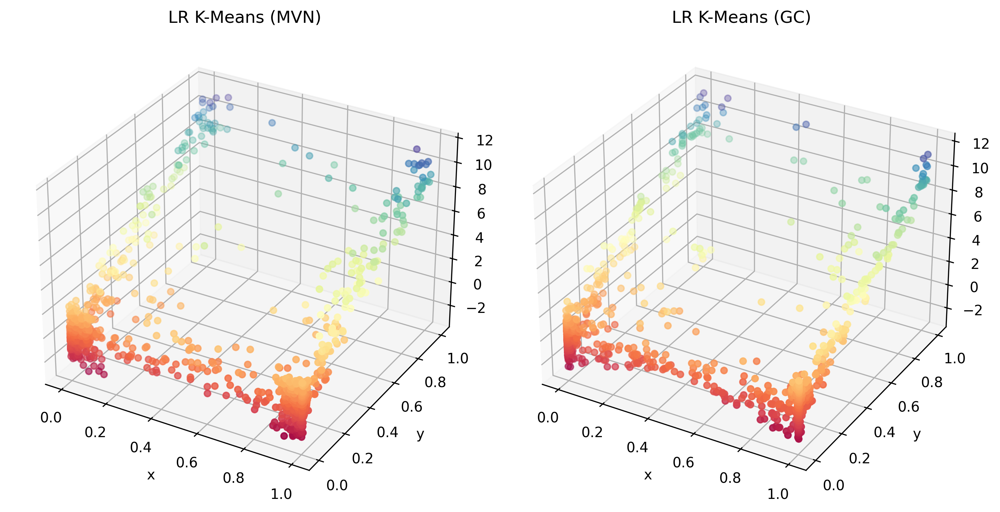

In [96]:
# plot `syn_clu_cov2` and `syn_clu_cop2`
fig = plt.figure(figsize=(10, 5), dpi=300)
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122, projection='3d')
ax1.scatter(syn_clu_cov2.synthetic.x, syn_clu_cov2.synthetic.y, syn_clu_cov2.synthetic.z, c = syn_clu_cov2.synthetic.z, cmap='Spectral')
ax2.scatter(syn_clu_cop2.synthetic.x, syn_clu_cop2.synthetic.y, syn_clu_cop2.synthetic.z, c = syn_clu_cop2.synthetic.z, cmap='Spectral')
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('z')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')
ax1.set_title('LR K-Means (MVN)')
ax2.set_title('LR K-Means (GC)')
plt.tight_layout()
plt.savefig('../../img/trivariate_kmeans.eps', format='eps')
plt.show()

Original sample has clusters around the corners. Local resamplers can replicate the original clustered sample quite well again. Replicating both samples, otherwise, should require computationally heavy-burden algorithms or nonparametric distributions which often require well hyperparameter-tuning. 

We replicate a real data set that contains more than three variables. We will, then, compare regression models estimated with the original and synthetic samples. The data set has median house values in California districts generated from 1990 US Census along with other explanatory variables such as median income, house age, average number of rooms/bedrooms, population, the average number of household members \citep{pace1997sparse}. 

In [28]:
housing = fetch_california_housing()
df = pd.DataFrame(housing['data'])
df.columns = housing['feature_names']
df[housing['target_names'][0]] = housing['target']
df = df[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population',
       'AveOccup', 'MedHouseVal']]
df.to_csv('california.csv', index = False)

The following cell will run the `synthpop.R` to create synthetic sample. 

In [9]:
subprocess.run('C:/Program Files/R/R-4.2.0/bin/Rscript.exe synthpop.R')

CompletedProcess(args='C:/Program Files/R/R-4.2.0/bin/Rscript.exe synthpop.R', returncode=0)

In [29]:
dfSynthpop = pd.read_csv('california_synthpop.csv')
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,3.422


In [34]:
syn5 = s.LocalCov(df, K = 15)
syn5.fit()

100%|██████████| 20640/20640 [00:16<00:00, 1248.20it/s]


,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal
0,8.280431,44.642741,6.439148,1.008550,690.775078,2.589153,4.284573
1,7.593804,21.270542,7.471360,1.008681,2178.532383,3.608210,3.196996
2,6.991226,52.000000,7.578597,1.024025,713.898305,2.473163,3.730700
3,5.766681,52.000000,5.956548,1.023521,548.251491,2.321196,3.385552
4,4.495726,51.120275,5.948862,0.965855,591.584262,2.603672,3.227864
...,...,...,...,...,...,...,...
20635,1.771305,25.052478,4.822664,1.073200,1088.451368,2.184644,0.856606
20636,2.851235,19.594281,6.163864,1.258023,376.869431,2.746039,0.939928
20637,1.540831,16.615383,5.375096,1.148832,762.022200,2.212404,0.824756
20638,1.776638,17.903440,5.322886,1.110069,674.613035,2.252870,0.582308


In [35]:
syn6 = s.LocalGaussianCopula(df, K=15)
syn6.fit()

100%|██████████| 20640/20640 [01:48<00:00, 189.67it/s]


,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal
0,8.584082,44.396703,6.843964,1.053809,542.748554,2.595382,5.000010
1,8.211377,16.533448,7.489914,0.971705,2380.559146,3.074477,3.262588
2,7.289913,52.000000,7.996257,0.974709,830.088879,2.494497,3.619868
3,4.946608,52.000000,5.675020,1.170523,635.164177,2.280489,3.518749
4,4.050936,52.000000,5.747716,1.056919,562.483627,2.310739,3.348861
...,...,...,...,...,...,...,...
20635,1.874411,26.000000,5.024597,1.100811,1094.371022,2.461492,0.813220
20636,2.555832,17.472792,6.271067,1.315624,620.771342,2.720101,0.776893
20637,1.697632,15.000000,5.426089,1.071764,1130.829588,2.675008,0.942395
20638,1.800080,17.000000,5.486252,1.145319,746.085986,2.837651,0.744979


In [36]:
syn7 = s.clusterCov(df, n_clusters=30, size_min=50)
syn7.fit()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal
0,3.855813,52.000000,4.567316,1.072402,752.687695,2.280439,2.840005
1,4.133297,41.506570,5.334318,1.127765,3.000000,2.922656,2.636851
2,3.157290,46.524716,4.332585,1.016746,580.146701,3.521025,1.864149
3,2.888249,37.192416,4.812867,1.044189,1733.452480,2.897183,2.089155
4,4.988221,48.857208,6.263339,0.958061,100.339071,2.688406,1.269431
...,...,...,...,...,...,...,...
891,2.930706,25.012456,4.747811,1.120872,2632.160308,3.354947,2.028935
892,3.222677,30.559529,4.716650,1.130507,2475.367049,3.125972,2.816904
893,2.457760,30.015756,4.430161,1.174081,2492.097567,3.074164,1.992223
894,3.776563,28.185604,4.411464,1.018500,2458.781148,4.068705,2.684960


In [37]:
syn8 = s.clusterGaussCopula(df, n_clusters=30, size_min=50)
syn8.fit()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal
0,3.193710,23.000000,3.684395,1.229851,1913.940303,2.951760,2.618197
1,3.235440,33.000000,4.861397,1.052632,686.093714,2.211716,2.500000
2,4.201115,29.000000,3.557998,0.946837,1645.535618,3.189079,2.891296
3,3.346039,30.000000,3.773986,1.043179,501.414294,2.795569,2.150000
4,3.518644,34.850263,4.263873,1.069229,2241.155522,2.239021,2.176216
...,...,...,...,...,...,...,...
164,4.749529,5.000000,6.745944,1.143680,6142.185559,2.464647,1.923741
165,6.083285,3.000000,8.555896,1.074176,6848.581784,4.255501,1.148616
166,1.985868,20.363093,2.955684,1.093667,6442.048614,2.483942,1.254185
167,3.279132,12.000000,5.009867,1.015485,6763.345595,3.551142,1.834723


In [38]:
descriptives_real = df.describe().T.iloc[:,[1,2,5]].round(3)
descriptives_real.columns = ['Average', 'Std.Dev', 'Median' ]
descriptives_syn = syn5.synthetic.describe().T.iloc[:,[1,2,5]].round(3)
descriptives_syn.columns = ['Average', 'Std.Dev', 'Median']
descriptives_syn2 = syn6.synthetic.describe().T.iloc[:,[1,2,5]].round(3)
descriptives_syn2.columns = ['Average', 'Std.Dev', 'Median' ]
descriptives = pd.concat({'Original':descriptives_real, 
                          'Synthetic: $k$NN-LR (MVN)':descriptives_syn, 
                          "Synthetic: $k$NN-LR (GC)":descriptives_syn2}, 
                          axis = 1)
descriptives.to_latex('../../tables/descriptives_new.tex')
descriptives

Original                     Synthetic: $k$NN-LR (MVN)            \
              Average   Std.Dev    Median                   Average   Std.Dev   
MedInc          3.871     1.900     3.535                     3.874     1.856   
HouseAge       28.639    12.586    29.000                    28.673    12.374   
AveRooms        5.429     2.474     5.229                     5.421     2.216   
AveBedrms       1.097     0.474     1.049                     1.088     0.402   
Population   1425.477  1132.462  1166.000                  1426.184  1068.249   
AveOccup        3.071    10.386     2.818                     2.942     4.497   
MedHouseVal     2.069     1.154     1.797                     2.059     1.137   

                      Synthetic: $k$NN-LR (GC)                      
               Median                  Average   Std.Dev    Median  
MedInc          3.530                    3.869     1.857     3.530  
HouseAge       28.811                   28.693    12.407    29.000  
AveRooms        5.230                    5.419     2.147     5.222  
AveBedrms       1.047                    1.089     0.419     1.047  
Population   1159.288                 1422.684  1046.092  1156.025  
AveOccup        2.846                    2.892     0.858     2.813  
MedHouseVal     1.785                    2.057     1.141     1.776

In [39]:
descriptives_syn = syn7.synthetic.describe().T.iloc[:,[1,2,5]].round(3)
descriptives_syn.columns = ['Average', 'Std.Dev', 'Median']
descriptives_real = syn8.synthetic.describe().T.iloc[:,[1,2,5]].round(3)
descriptives_real.columns = ['Average', 'Std.Dev', 'Median']
descriptives = pd.concat({'Synthetic: C-LR (MVN)':descriptives_real, 'Synthetic: C-LR (GC)':descriptives_syn}, axis = 1)
descriptives.to_latex('../../tables/descriptives_cluster_new.tex')
descriptives

Synthetic: C-LR (MVN)                     Synthetic: C-LR (GC)  \
                          Average   Std.Dev    Median              Average   
MedInc                      3.880     1.904     3.548                3.872   
HouseAge                   28.569    12.588    29.000               28.629   
AveRooms                    5.415     2.128     5.223                5.426   
AveBedrms                   1.096     0.451     1.049                1.096   
Population               1431.426  1137.441  1174.000             1430.698   
AveOccup                    3.019     7.702     2.815                3.200   
MedHouseVal                 2.071     1.152     1.805                2.065   

                                 
              Std.Dev    Median  
MedInc          1.887     3.523  
HouseAge       12.472    29.154  
AveRooms        2.377     5.224  
AveBedrms       0.445     1.056  
Population   1137.788  1169.871  
AveOccup        9.379     2.895  
MedHouseVal     1.140     1.821

In [52]:
df_knn_mvn = syn5.synthetic.copy()
df_knn_gc = syn6.synthetic.copy()
df_clu_mvn = syn7.synthetic.copy()
df_clu_gc = syn8.synthetic.copy()

df['constant'] = 1
df_knn_mvn['constant'] = 1
df_knn_gc['constant'] = 1
df_clu_mvn['constant'] = 1
df_clu_gc['constant'] = 1
dfSynthpop['constant'] = 1
X = ['constant', 'MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup']
Y = 'MedHouseVal'

In [54]:
from sdv.metadata import SingleTableMetadata

metadata = SingleTableMetadata()
metadata.detect_from_dataframe(df)
fastml = SingleTablePreset(metadata = metadata, name = 'FAST_ML')
fastml.fit(df)
dfSDV = fastml.sample(df.shape[0])

In [57]:
original = sm.OLS(df[Y], df[X]).fit()
knn_mvn = sm.OLS(df_knn_mvn[Y], df_knn_mvn[X]).fit()
knn_gc = sm.OLS(df_knn_gc[Y], df_knn_gc[X]).fit()
cluster_mvn = sm.OLS(df_clu_mvn[Y], df_clu_mvn[X]).fit()
cluster_gauss = sm.OLS(df_clu_gc[Y], df_clu_gc[X]).fit()
sdvv= sm.OLS(dfSDV[Y], dfSDV[X]).fit()
synthpop = sm.OLS(dfSynthpop[Y], dfSynthpop[X]).fit()

In [59]:
reg_table = summary_col([original, knn_mvn, knn_gc, cluster_mvn, cluster_gauss, sdvv, synthpop], 
model_names= ['Original', '$k$NN-LR (MVN)', '$k$NN-LR (GC)', 'C-LR (MVN)', 'C-LR (GC)', 'FAST ML', 'Synthpop'],
stars = True,
float_format='%.4f')
reg_table

,Original,$k$NN-LR (MVN),$k$NN-LR (GC),C-LR (MVN),C-LR (GC),FAST ML,Synthpop
constant,-0.4391***,-0.7364***,0.0807***,-0.4398***,-0.1604***,-0.2355***,0.0104
,(0.0276),(0.0281),(0.0309),(0.0280),(0.0276),(0.0282),(0.0263)
MedInc,0.5369***,0.6087***,0.5988***,0.5347***,0.5036***,0.5467***,0.4566***
,(0.0041),(0.0042),(0.0041),(0.0041),(0.0038),(0.0042),(0.0034)
HouseAge,0.0165***,0.0168***,0.0173***,0.0165***,0.0162***,0.0164***,0.0164***
,(0.0005),(0.0004),(0.0004),(0.0005),(0.0005),(0.0005),(0.0005)
AveRooms,-0.2117***,-0.3124***,-0.2999***,-0.2169***,-0.1465***,-0.1619***,-0.0851***
,(0.0060),(0.0064),(0.0065),(0.0060),(0.0052),(0.0041),(0.0042)
AveBedrms,0.9937***,1.5311***,1.2893***,1.0218***,0.5438***,0.5967***,0.3262***
,(0.0295),(0.0329),(0.0307),(0.0298),(0.0227),(0.0185),(0.0174)


In [60]:
print(reg_table.as_latex())

\begin{table}
\caption{}
\label{}
\begin{center}
\begin{tabular}{llllllll}
\hline
               & Original   & \$k\$NN-LR (MVN) & \$k\$NN-LR (GC) & C-LR (MVN) & C-LR (GC)  & FAST ML    & Synthpop    \\
\hline
constant       & -0.4391*** & -0.7364***       & 0.0807***       & -0.4398*** & -0.1604*** & -0.2355*** & 0.0104      \\
               & (0.0276)   & (0.0281)         & (0.0309)        & (0.0280)   & (0.0276)   & (0.0282)   & (0.0263)    \\
MedInc         & 0.5369***  & 0.6087***        & 0.5988***       & 0.5347***  & 0.5036***  & 0.5467***  & 0.4566***   \\
               & (0.0041)   & (0.0042)         & (0.0041)        & (0.0041)   & (0.0038)   & (0.0042)   & (0.0034)    \\
HouseAge       & 0.0165***  & 0.0168***        & 0.0173***       & 0.0165***  & 0.0162***  & 0.0164***  & 0.0164***   \\
               & (0.0005)   & (0.0004)         & (0.0004)        & (0.0005)   & (0.0005)   & (0.0005)   & (0.0005)    \\
AveRooms       & -0.2117*** & -0.3124***       & -0.2999***     

In [62]:
print(1-KSComplement.compute(df, df_knn_mvn))
print(1-KSComplement.compute(df, df_knn_gc))
print(1-KSComplement.compute(df, df_clu_mvn))
print(1-KSComplement.compute(df, df_clu_gc))
print(1-KSComplement.compute(df, dfSDV))
print(1-KSComplement.compute(df, dfSynthpop))

0.02209302325581397
0.021675145348837188
0.029414970930232487
0.0043483527131783495
0.1667453972868218
0.011615794573643479


In [63]:
df.shape

(20640, 8)

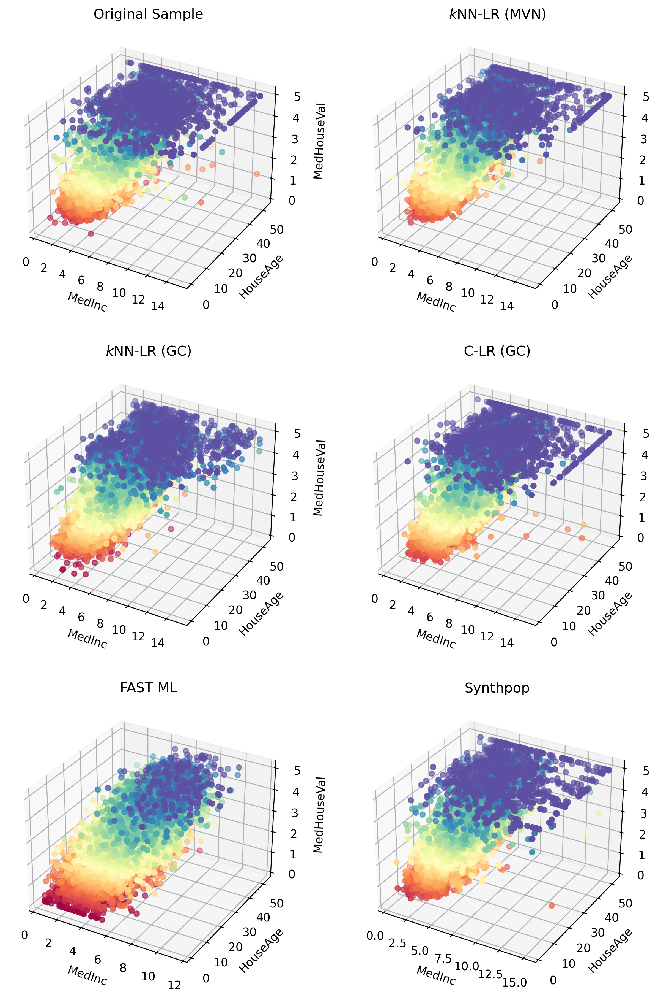

In [101]:
x, y, z = ('MedInc', 'HouseAge', 'MedHouseVal')

fig = plt.figure(dpi = 300, figsize= (10,15))
ax1 = fig.add_subplot(321, projection='3d')
ax1.set_title('Original Sample')
ax1.scatter(df[x], df[y], df[z], c=df[z], cmap="Spectral")
ax1.set_xlabel(x)
ax1.set_ylabel(y)
ax1.set_zlabel(z)

ax2 = fig.add_subplot(322, projection='3d')
ax2.set_title('$k$NN-LR (MVN)')
ax2.scatter(df_knn_mvn[x], df_knn_mvn[y], df_knn_mvn[z], c=df_knn_mvn[z], cmap="Spectral")
ax2.set_xlabel(x)
ax2.set_ylabel(y)
ax2.set_zlabel(z)

ax3 = fig.add_subplot(323, projection='3d')
ax3.set_title('$k$NN-LR (GC)')
ax3.scatter(df_clu_mvn[x], df_clu_mvn[y], df_clu_mvn[z], c=df_clu_mvn[z], cmap="Spectral")
ax3.set_xlabel(x)
ax3.set_ylabel(y)
ax3.set_zlabel(z)

ax4 = fig.add_subplot(324, projection='3d')
ax4.set_title('C-LR (GC)')
ax4.scatter(df_clu_gc[x], df_clu_gc[y], df_clu_gc[z], c=df_clu_gc[z], cmap="Spectral")
ax4.set_xlabel(x)
ax4.set_ylabel(y)
ax4.set_zlabel(z)

ax5 = fig.add_subplot(325, projection='3d')
ax5.set_title('FAST ML')
ax5.scatter(dfSDV[x], dfSDV[y], dfSDV[z], c=dfSDV[z], cmap="Spectral")
ax5.set_xlabel(x)
ax5.set_ylabel(y)
ax5.set_zlabel(z)

ax6 = fig.add_subplot(326, projection='3d')
ax6.set_title('Synthpop')
ax6.scatter(dfSynthpop[x], dfSynthpop[y], dfSynthpop[z], c=dfSynthpop[z], cmap="Spectral")
ax6.set_xlabel(x)
ax6.set_ylabel(y)
ax6.set_zlabel(z)
plt.savefig('../../img/localcov_fastML_synthpop_new.png', bbox_inches='tight')
plt.show()


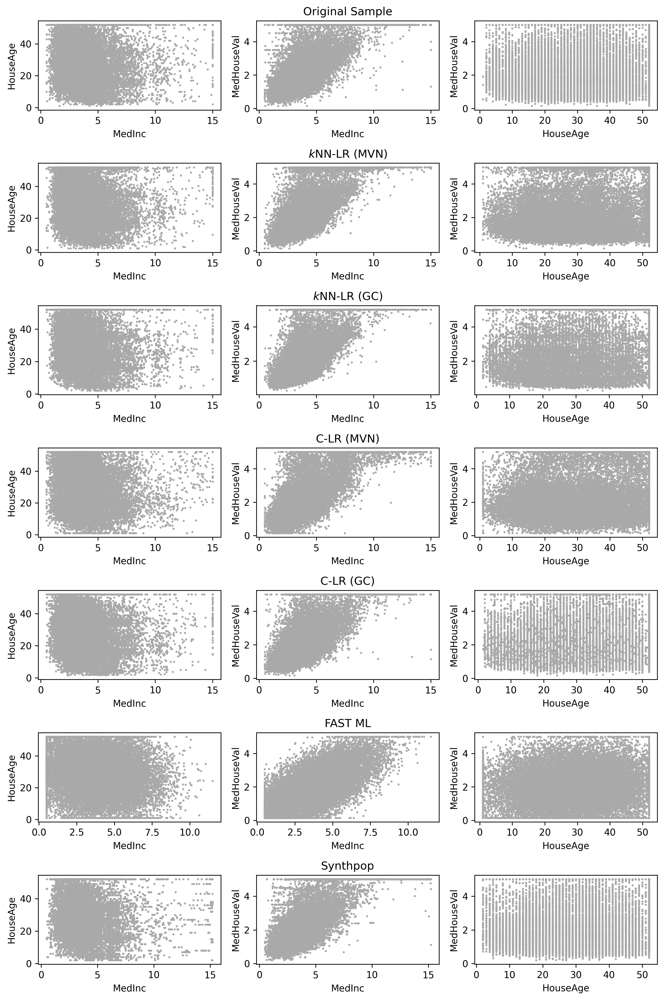

In [99]:
fig, ax = plt.subplots(7, 3, figsize=(10, 15), dpi = 300)
ax[0,0].scatter(df[x], df[y], s = 1.5, color='darkgray')
ax[0,1].scatter(df[x], df[z], s = 1.5, color='darkgray')
ax[0,2].scatter(df[y], df[z], s = 1.5, color='darkgray')
ax[1,0].scatter(df_knn_mvn[x], df_knn_mvn[y], s = 1.5, color='darkgray')
ax[1,1].scatter(df_knn_mvn[x], df_knn_mvn[z], s = 1.5, color='darkgray')
ax[1,2].scatter(df_knn_mvn[y], df_knn_mvn[z], s = 1.5, color='darkgray')
ax[2,0].scatter(df_knn_gc[x], df_knn_gc[y], s = 1.5, color='darkgray')
ax[2,1].scatter(df_knn_gc[x], df_knn_gc[z], s = 1.5, color='darkgray')
ax[2,2].scatter(df_knn_gc[y], df_knn_gc[z], s = 1.5, color='darkgray')
ax[3,0].scatter(df_clu_mvn[x], df_clu_mvn[y], s = 1.5, color='darkgray')
ax[3,1].scatter(df_clu_mvn[x], df_clu_mvn[z], s = 1.5, color='darkgray')
ax[3,2].scatter(df_clu_mvn[y], df_clu_mvn[z], s = 1.5, color='darkgray')
ax[4,0].scatter(df_clu_gc[x], df_clu_gc[y], s = 1.5, color='darkgray')
ax[4,1].scatter(df_clu_gc[x], df_clu_gc[z], s = 1.5, color='darkgray')
ax[4,2].scatter(df_clu_gc[y], df_clu_gc[z], s = 1.5, color='darkgray')
ax[5,0].scatter(dfSDV[x], dfSDV[y], s = 1.5, color='darkgray')
ax[5,1].scatter(dfSDV[x], dfSDV[z], s = 1.5, color='darkgray')
ax[5,2].scatter(dfSDV[y], dfSDV[z], s = 1.5, color='darkgray')
ax[6,0].scatter(dfSynthpop[x], dfSynthpop[y], s = 1.5, color='darkgray')
ax[6,1].scatter(dfSynthpop[x], dfSynthpop[z], s = 1.5, color='darkgray')
ax[6,2].scatter(dfSynthpop[y], dfSynthpop[z], s = 1.5, color='darkgray')
# set x,y labels for all 
for i in range(7):
    ax[i,0].set_xlabel(x)
    ax[i,1].set_xlabel(x)
    ax[i,2].set_xlabel(y)
    ax[i,0].set_ylabel(y)
    ax[i,1].set_ylabel(z)
    ax[i,2].set_ylabel(z)
# set title for each row
ax[0,1].set_title('Original Sample')
ax[1,1].set_title('$k$NN-LR (MVN)')
ax[2,1].set_title('$k$NN-LR (GC)')
ax[3,1].set_title('C-LR (MVN)')
ax[4,1].set_title('C-LR (GC)')
ax[5,1].set_title('FAST ML')
ax[6,1].set_title('Synthpop')
plt.tight_layout()
plt.savefig('../../img/localcov_fastML_synthpop_2d_darkgray.png', bbox_inches='tight')
plt.show()


## How well synthpop perform with non-convex distributions?

In [70]:
circulars = pd.read_csv('circulars_synthpop.csv')
trivariate = pd.read_csv('trivariate_synthpop.csv')

In [73]:
metadata = SingleTableMetadata()
metadata.detect_from_dataframe(data)
fastml_bi = SingleTablePreset(metadata=metadata, name = 'FAST_ML')
fastml_bi.fit(data)
fastml_bi = fastml_bi.sample(data.shape[0])
metadata = SingleTableMetadata()
metadata.detect_from_dataframe(data2)
fastml_tri = SingleTablePreset(metadata=metadata, name = 'FAST_ML')
fastml_tri.fit(data2)
fastml_tri = fastml_tri.sample(data2.shape[0])

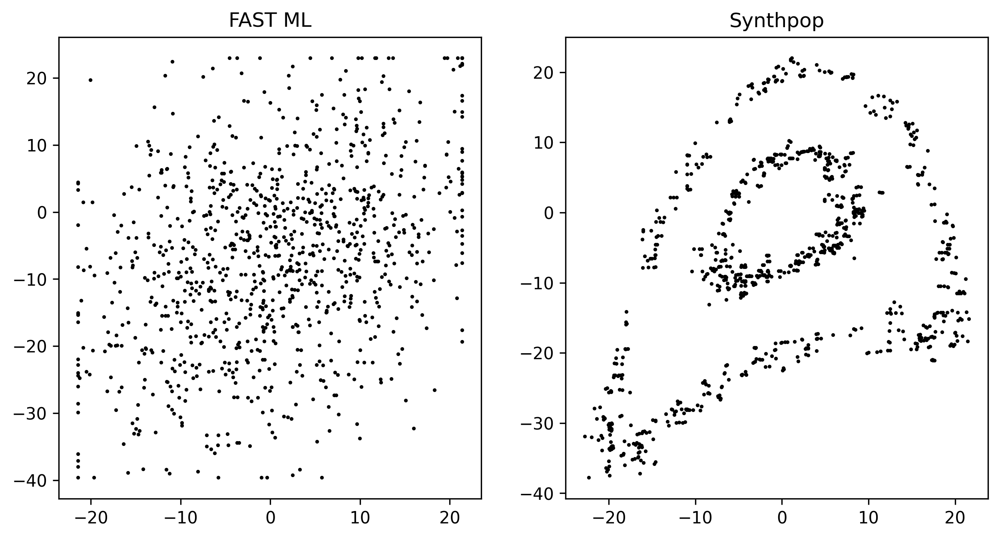

In [90]:
fig, ax = plt.subplots(1,2, figsize = (10,5), dpi = 300)
ax[0].scatter(fastml_bi.x, fastml_bi.y, s = 1.5, color = 'black')
ax[0].set_title('FAST ML')
ax[1].scatter(circulars.x, circulars.y, s = 1.5, color = 'black')
ax[1].set_title('Synthpop')
plt.savefig('../../img/circulars_synthpop_fastml.eps', bbox_inches='tight', format = 'eps')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


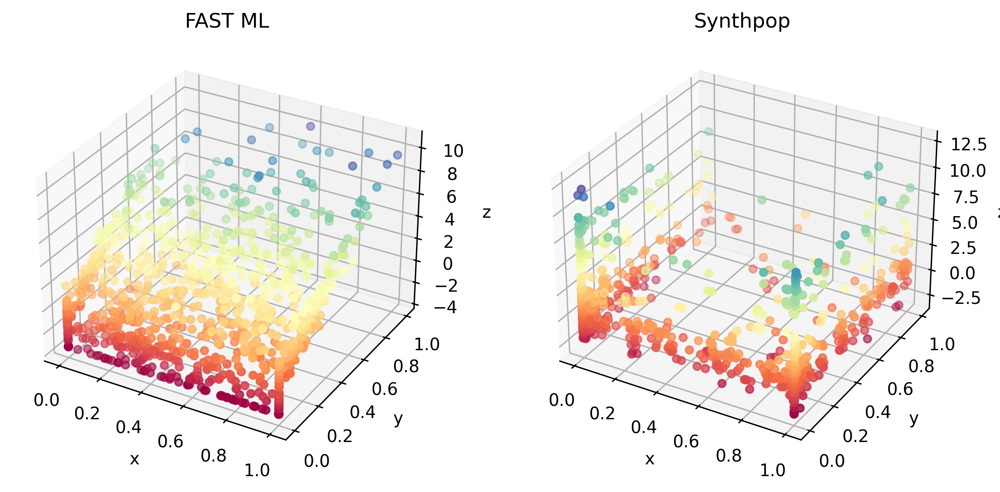

In [100]:
fig = plt.figure(dpi = 300, figsize= (10,5))
ax1 = fig.add_subplot(121, projection='3d')
ax1.set_title('FAST ML')
ax1.scatter(fastml_tri.x, fastml_tri.y, fastml_tri.z, c=fastml_tri.z, cmap="Spectral")
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('z')
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(trivariate.x, trivariate.y, trivariate.z, c=trivariate.z, cmap="Spectral")
ax2.set_title('Synthpop')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')
plt.savefig('../../img/trivariate_synthpop.eps', bbox_inches='tight', format = 'eps')
plt.show()